In [1]:
# Importing packages
import torch
import torch.nn as nn
import torchvision
import torchvision.transforms as transforms
import albumentations as A
from albumentations.pytorch import ToTensorV2
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import os
from PIL import Image
from torch.utils.data import Dataset, DataLoader
from tqdm import tqdm
import torchmetrics
import torchinfo
import torch.nn.functional as F
import cv2

In [2]:
# Data pathes
train_images = 'data/Massachusetts/tiff/train'
train_labels = 'data/Massachusetts/tiff/train_labels'
val_images = 'data/Massachusetts/tiff/val'
val_labels = 'data/Massachusetts/tiff/val_labels'
test_images = 'data/Massachusetts/tiff/test'
test_labels = 'data/Massachusetts/tiff/test_labels'

In [3]:
# Hyperparams
DEVICE = torch.device('cuda:1' if torch.cuda.is_available() else 'cpu')
IN_CHANNELS = 3
CLASSES = 2
TRAIN_BATCH = 8
VALID_BATCH = 2
NUM_WORKERS = 8
LR = 0.001
EPOCHS = 100

In [4]:
# Train and test augmentations

A_train = A.Compose([#A.Resize(224, 224, interpolation=cv2.INTER_NEAREST), 
                     A.RandomCrop(height=256, width=256, always_apply=True),
                     A.OneOf([
                       A.VerticalFlip(p=1),
                       A.HorizontalFlip(p=1),
                       A.RandomRotate90(p=1)], p=1),  
#                     A.Normalize(
#                                 mean=[0.485, 0.456, 0.406], 
#                                 std=[0.229, 0.224, 0.225],
#                                 max_pixel_value=255.0),
                     A.Normalize(
                                mean=[0.4299, 0.4328, 0.3964], 
                                std=[0.2711, 0.2666, 0.2816],
                                max_pixel_value=255.0),
                  ToTensorV2()])


A_val =  A.Compose([ #A.Resize(224, 224, interpolation=cv2.INTER_NEAREST),
                    A.PadIfNeeded(min_height=1504, min_width=1504, always_apply=True, border_mode=0),
                   A.Normalize(
                                mean=[0.4299, 0.4328, 0.3964], 
                                std=[0.2711, 0.2666, 0.2816],
                                max_pixel_value=255.0),
#                      A.Normalize(
#                                 mean=[0.485, 0.456, 0.406], 
#                                 std=[0.229, 0.224, 0.225],
#                                 max_pixel_value=255.0),
                    
                   ToTensorV2()])

In [5]:
# Dataset class
class MassachussetsDataset(Dataset):
    def __init__(self, img_path, mask_path, transforms=None):
        super().__init__()
        self.img_path = img_path
        self.mask_path = mask_path
        self.transforms = transforms
        self.images_list = os.listdir(img_path)

    def __len__(self):
        return len(self.images_list)

    def __getitem__(self, index):
        image = np.array(Image.open(os.path.join(self.img_path, self.images_list[index])).convert("RGB"))
        mask = np.array(Image.open(os.path.join(self.mask_path, self.images_list[index].replace('.tiff', '.tif'))).convert("L"), dtype=np.float32)
        mask[mask==255] = 1.0

        if self.transforms is not None:
            aug  = self.transforms(image=image, mask=mask)
            image = aug['image']
            mask = aug['mask']
            

        return image, mask

In [6]:
# Datasets and Dataloaders

train_set = MassachussetsDataset(train_images, train_labels, transforms=A_train)
valid_set = MassachussetsDataset(val_images, val_labels, transforms=A_val)
test_set = MassachussetsDataset(test_images, test_labels, transforms=A_val)


train_loader = DataLoader(train_set, shuffle=True, batch_size=TRAIN_BATCH, num_workers=NUM_WORKERS)
valid_loader = DataLoader(valid_set, shuffle=True, batch_size=VALID_BATCH, num_workers=NUM_WORKERS)
test_loader = DataLoader(test_set, shuffle=True, batch_size=VALID_BATCH, num_workers=NUM_WORKERS)

In [7]:
img, mask = train_set[2]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


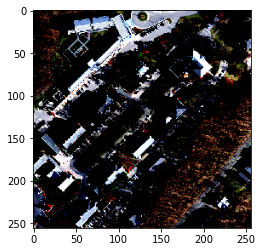

In [8]:
plt.imshow(img.permute(1, 2, 0))

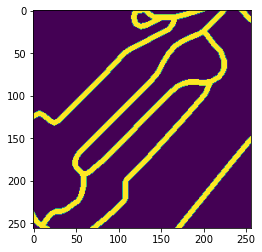

In [9]:
plt.imshow(mask)

In [10]:
print(np.unique(mask))

[0. 1.]


In [11]:
model = torchvision.models.segmentation.fcn_resnet50(pretrained=False, num_classes=1).to(DEVICE)
# from torchinfo import summary

# batch_size = 8
# summary(model, input_size=(batch_size, 3, 256, 256))

In [12]:
# Custom loss functions
class DiceLoss(nn.Module):
    def __init__(self, weight=None, size_average=True):
        super(DiceLoss, self).__init__()

    def forward(self, inputs, targets, smooth=1):
        
        #comment out if your model contains a sigmoid or equivalent activation layer
        inputs = F.sigmoid(inputs)       
        
        #flatten label and prediction tensors
        inputs = inputs.view(-1)
        targets = targets.view(-1)
        
        intersection = (inputs * targets).sum()                            
        dice = (2.*intersection + smooth)/(inputs.sum() + targets.sum() + smooth)  
        
        return 1 - dice
    
#####################################################################################    
class DiceBCELoss(nn.Module):
    def __init__(self, weight=None, size_average=True):
        super(DiceBCELoss, self).__init__()

    def forward(self, inputs, targets, smooth=1):
        
        #comment out if your model contains a sigmoid or equivalent activation layer
        inputs = F.sigmoid(inputs)       
        
        #flatten label and prediction tensors
        inputs = inputs.view(-1)
        targets = targets.view(-1)
        
        intersection = (inputs * targets).sum()                            
        dice_loss = 1 - (2.*intersection + smooth)/(inputs.sum() + targets.sum() + smooth)  
        BCE = F.binary_cross_entropy(inputs, targets, reduction='mean')
        Dice_BCE = BCE + dice_loss
        
        return Dice_BCE
#####################################################################################    
class IoULoss(nn.Module):
    def __init__(self, weight=None, size_average=True):
        super(IoULoss, self).__init__()

    def forward(self, inputs, targets, smooth=1):
        
        #comment out if your model contains a sigmoid or equivalent activation layer
        inputs = F.sigmoid(inputs)       
        
        #flatten label and prediction tensors
        inputs = inputs.view(-1)
        targets = targets.view(-1)
        
        #intersection is equivalent to True Positive count
        #union is the mutually inclusive area of all labels & predictions 
        intersection = (inputs * targets).sum()
        total = (inputs + targets).sum()
        union = total - intersection 
        
        IoU = (intersection + smooth)/(union + smooth)
                
        return 1 - IoU
    
#####################################################################################    
ALPHA = 0.8
GAMMA = 2

class FocalLoss(nn.Module):
    def __init__(self, weight=None, size_average=True):
        super(FocalLoss, self).__init__()

    def forward(self, inputs, targets, alpha=0.8, gamma=2, smooth=1):
        
        #comment out if your model contains a sigmoid or equivalent activation layer
        inputs = F.sigmoid(inputs)       
        
        #flatten label and prediction tensors
        inputs = inputs.view(-1)
        targets = targets.view(-1)
        
        #first compute binary cross-entropy 
        BCE = F.binary_cross_entropy(inputs, targets, reduction='mean')
        BCE_EXP = torch.exp(-BCE)
        focal_loss = alpha * (1-BCE_EXP)**gamma * BCE
                       
        return focal_loss
    
    
#####################################################################################
ALPHA = 0.5
BETA = 0.5

class TverskyLoss(nn.Module):
    def __init__(self, weight=None, size_average=True):
        super(TverskyLoss, self).__init__()

    def forward(self, inputs, targets, smooth=1, alpha=ALPHA, beta=BETA):
        
        #comment out if your model contains a sigmoid or equivalent activation layer
        inputs = F.sigmoid(inputs)       
        
        #flatten label and prediction tensors
        inputs = inputs.view(-1)
        targets = targets.view(-1)
        
        #True Positives, False Positives & False Negatives
        TP = (inputs * targets).sum()    
        FP = ((1-targets) * inputs).sum()
        FN = (targets * (1-inputs)).sum()
       
        Tversky = (TP + smooth) / (TP + alpha*FP + beta*FN + smooth)  
        
        return 1 - Tversky

In [13]:
# criterion = nn.BCEWithLogitsLoss().to(DEVICE)
# criterion = DiceLoss().to(DEVICE)
criterion = DiceBCELoss().to(DEVICE)
optimizer = torch.optim.Adam(model.parameters(), lr=LR)
scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=200)

In [14]:
def mIoU(pred_mask, mask, smooth=1e-10, n_classes=CLASSES):
    with torch.no_grad():
        pred_mask = nn.functional.sigmoid(pred_mask)
        pred_mask = (pred_mask > 0.5).float()
        pred_mask = pred_mask.contiguous().view(-1)
        mask = mask.contiguous().view(-1)

        iou_per_class = []
        for clas in range(0, n_classes): #loop per pixel class
            true_class = pred_mask == clas
            true_label = mask == clas

            if true_label.long().sum().item() == 0: #no exist label in this loop
                iou_per_class.append(np.nan)
            else:
                intersect = torch.logical_and(true_class, true_label).sum().float().item()
                union = torch.logical_or(true_class, true_label).sum().float().item()

                iou = (intersect + smooth) / (union + smooth)
                iou_per_class.append(iou)
        return np.nanmean(iou_per_class)

In [15]:
def plot_images(img, mask, pred):
    f, ax = plt.subplots(1, 3)
    ax[0].imshow(img)
    ax[0].set_xlabel("Image")
    ax[1].imshow(mask)
    ax[1].set_xlabel("Ground Truth")
    ax[2].imshow(pred)
    ax[2].set_xlabel("Prediction")

  0%|          | 0/139 [00:00<?, ?it/s]/data1/hom1/ict11/.conda/envs/ict11-smp/lib/python3.8/site-packages/torch/nn/functional.py:1806: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")
100%|██████████| 7/7 [00:04<00:00,  1.62it/s, valid_loss=0.504, valid_miou=0.732]


Epoch-1 Train mean loss: 0.8046 Train MIOU: 0.6186
Epoch-1 Valid mean loss: 0.6107 Valid MIOU: 0.6883


100%|██████████| 7/7 [00:04<00:00,  1.63it/s, valid_loss=0.476, valid_miou=0.737]


Epoch-2 Train mean loss: 0.6231 Train MIOU: 0.6809
Epoch-2 Valid mean loss: 0.5956 Valid MIOU: 0.6953


100%|██████████| 7/7 [00:04<00:00,  1.58it/s, valid_loss=0.542, valid_miou=0.696]


Epoch-3 Train mean loss: 0.5922 Train MIOU: 0.6932
Epoch-3 Valid mean loss: 0.6089 Valid MIOU: 0.6885


100%|██████████| 7/7 [00:04<00:00,  1.67it/s, valid_loss=0.445, valid_miou=0.762]


Epoch-4 Train mean loss: 0.5792 Train MIOU: 0.6987
Epoch-4 Valid mean loss: 0.5226 Valid MIOU: 0.7270


100%|██████████| 7/7 [00:04<00:00,  1.60it/s, valid_loss=0.447, valid_miou=0.757]


Epoch-5 Train mean loss: 0.5780 Train MIOU: 0.7001
Epoch-5 Valid mean loss: 0.5092 Valid MIOU: 0.7309


100%|██████████| 7/7 [00:03<00:00,  2.02it/s, valid_loss=0.604, valid_miou=0.709]


Epoch-6 Train mean loss: 0.5624 Train MIOU: 0.7054
Epoch-6 Valid mean loss: 0.5172 Valid MIOU: 0.7331


100%|██████████| 7/7 [00:04<00:00,  1.74it/s, valid_loss=0.445, valid_miou=0.752]


Epoch-7 Train mean loss: 0.5455 Train MIOU: 0.7143
Epoch-7 Valid mean loss: 0.5414 Valid MIOU: 0.7216


100%|██████████| 7/7 [00:04<00:00,  1.59it/s, valid_loss=0.488, valid_miou=0.734]


Epoch-8 Train mean loss: 0.5564 Train MIOU: 0.7092
Epoch-8 Valid mean loss: 0.4937 Valid MIOU: 0.7395


100%|██████████| 7/7 [00:04<00:00,  1.58it/s, valid_loss=0.492, valid_miou=0.75] 


Epoch-9 Train mean loss: 0.5445 Train MIOU: 0.7129
Epoch-9 Valid mean loss: 0.5043 Valid MIOU: 0.7365


100%|██████████| 7/7 [00:05<00:00,  1.27it/s, valid_loss=0.649, valid_miou=0.703]


Epoch-10 Train mean loss: 0.5489 Train MIOU: 0.7108
Epoch-10 Valid mean loss: 0.4816 Valid MIOU: 0.7465


100%|██████████| 7/7 [00:04<00:00,  1.59it/s, valid_loss=0.42, valid_miou=0.772] 


Epoch-11 Train mean loss: 0.5303 Train MIOU: 0.7188
Epoch-11 Valid mean loss: 0.5051 Valid MIOU: 0.7358


100%|██████████| 7/7 [00:03<00:00,  1.87it/s, valid_loss=0.499, valid_miou=0.75] 


Epoch-12 Train mean loss: 0.5217 Train MIOU: 0.7232
Epoch-12 Valid mean loss: 0.4704 Valid MIOU: 0.7509


100%|██████████| 7/7 [00:03<00:00,  1.82it/s, valid_loss=0.463, valid_miou=0.762]


Epoch-13 Train mean loss: 0.5336 Train MIOU: 0.7193
Epoch-13 Valid mean loss: 0.4836 Valid MIOU: 0.7435


100%|██████████| 7/7 [00:04<00:00,  1.49it/s, valid_loss=0.522, valid_miou=0.705]


Epoch-14 Train mean loss: 0.5550 Train MIOU: 0.7109
Epoch-14 Valid mean loss: 0.5462 Valid MIOU: 0.7180


100%|██████████| 7/7 [00:04<00:00,  1.53it/s, valid_loss=0.413, valid_miou=0.774]


Epoch-15 Train mean loss: 0.5233 Train MIOU: 0.7237
Epoch-15 Valid mean loss: 0.4612 Valid MIOU: 0.7527


100%|██████████| 7/7 [00:04<00:00,  1.57it/s, valid_loss=0.445, valid_miou=0.758]


Epoch-16 Train mean loss: 0.5419 Train MIOU: 0.7155
Epoch-16 Valid mean loss: 0.4767 Valid MIOU: 0.7516


100%|██████████| 7/7 [00:04<00:00,  1.50it/s, valid_loss=0.459, valid_miou=0.752]


Epoch-17 Train mean loss: 0.5114 Train MIOU: 0.7305
Epoch-17 Valid mean loss: 0.4976 Valid MIOU: 0.7406


100%|██████████| 7/7 [00:04<00:00,  1.56it/s, valid_loss=0.543, valid_miou=0.735]


Epoch-18 Train mean loss: 0.5097 Train MIOU: 0.7283
Epoch-18 Valid mean loss: 0.4715 Valid MIOU: 0.7528


100%|██████████| 7/7 [00:03<00:00,  2.00it/s, valid_loss=0.463, valid_miou=0.739]


Epoch-19 Train mean loss: 0.5105 Train MIOU: 0.7278
Epoch-19 Valid mean loss: 0.4745 Valid MIOU: 0.7481


100%|██████████| 7/7 [00:04<00:00,  1.40it/s, valid_loss=0.49, valid_miou=0.749] 


Epoch-20 Train mean loss: 0.5186 Train MIOU: 0.7259
Epoch-20 Valid mean loss: 0.4751 Valid MIOU: 0.7478


100%|██████████| 7/7 [00:03<00:00,  1.86it/s, valid_loss=0.479, valid_miou=0.746]


Epoch-21 Train mean loss: 0.5109 Train MIOU: 0.7270
Epoch-21 Valid mean loss: 0.4761 Valid MIOU: 0.7477


100%|██████████| 7/7 [00:05<00:00,  1.39it/s, valid_loss=0.498, valid_miou=0.737]


Epoch-22 Train mean loss: 0.4915 Train MIOU: 0.7355
Epoch-22 Valid mean loss: 0.4666 Valid MIOU: 0.7513


100%|██████████| 7/7 [00:04<00:00,  1.49it/s, valid_loss=0.546, valid_miou=0.694]


Epoch-23 Train mean loss: 0.5070 Train MIOU: 0.7282
Epoch-23 Valid mean loss: 0.5075 Valid MIOU: 0.7316


100%|██████████| 7/7 [00:04<00:00,  1.55it/s, valid_loss=0.406, valid_miou=0.769]


Epoch-24 Train mean loss: 0.5109 Train MIOU: 0.7272
Epoch-24 Valid mean loss: 0.4504 Valid MIOU: 0.7584


100%|██████████| 7/7 [00:04<00:00,  1.47it/s, valid_loss=0.465, valid_miou=0.761]


Epoch-25 Train mean loss: 0.5112 Train MIOU: 0.7273
Epoch-25 Valid mean loss: 0.4782 Valid MIOU: 0.7466


100%|██████████| 7/7 [00:04<00:00,  1.51it/s, valid_loss=0.455, valid_miou=0.767]


Epoch-26 Train mean loss: 0.5007 Train MIOU: 0.7326
Epoch-26 Valid mean loss: 0.4567 Valid MIOU: 0.7547


100%|██████████| 7/7 [00:04<00:00,  1.47it/s, valid_loss=0.412, valid_miou=0.766]


Epoch-27 Train mean loss: 0.4992 Train MIOU: 0.7318
Epoch-27 Valid mean loss: 0.4952 Valid MIOU: 0.7408


100%|██████████| 7/7 [00:04<00:00,  1.50it/s, valid_loss=0.407, valid_miou=0.779]


Epoch-28 Train mean loss: 0.5075 Train MIOU: 0.7286
Epoch-28 Valid mean loss: 0.4544 Valid MIOU: 0.7568


100%|██████████| 7/7 [00:04<00:00,  1.68it/s, valid_loss=0.363, valid_miou=0.784]


Epoch-29 Train mean loss: 0.5007 Train MIOU: 0.7332
Epoch-29 Valid mean loss: 0.4549 Valid MIOU: 0.7558


 86%|████████▌ | 6/7 [00:04<00:00,  1.49it/s, valid_loss=0.39, valid_miou=0.777] /tmp/ipykernel_21659/1924939012.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f, ax = plt.subplots(1, 3)
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
100%|██████████| 7/7 [00:05<00:00,  1.26it/s, valid_loss=0.398, valid_miou=0.783]


Epoch-30 Train mean loss: 0.5149 Train MIOU: 0.7260
Epoch-30 Valid mean loss: 0.4575 Valid MIOU: 0.7592


100%|██████████| 7/7 [00:04<00:00,  1.49it/s, valid_loss=0.461, valid_miou=0.768]


Epoch-31 Train mean loss: 0.5038 Train MIOU: 0.7328
Epoch-31 Valid mean loss: 0.4773 Valid MIOU: 0.7493


100%|██████████| 7/7 [00:04<00:00,  1.45it/s, valid_loss=0.43, valid_miou=0.756] 


Epoch-32 Train mean loss: 0.5050 Train MIOU: 0.7316
Epoch-32 Valid mean loss: 0.4872 Valid MIOU: 0.7436


100%|██████████| 7/7 [00:04<00:00,  1.48it/s, valid_loss=0.509, valid_miou=0.745]


Epoch-33 Train mean loss: 0.5089 Train MIOU: 0.7299
Epoch-33 Valid mean loss: 0.4459 Valid MIOU: 0.7616


100%|██████████| 7/7 [00:04<00:00,  1.47it/s, valid_loss=0.389, valid_miou=0.781]


Epoch-34 Train mean loss: 0.4972 Train MIOU: 0.7340
Epoch-34 Valid mean loss: 0.4640 Valid MIOU: 0.7531


100%|██████████| 7/7 [00:04<00:00,  1.44it/s, valid_loss=0.406, valid_miou=0.775]


Epoch-35 Train mean loss: 0.5024 Train MIOU: 0.7311
Epoch-35 Valid mean loss: 0.4753 Valid MIOU: 0.7465


100%|██████████| 7/7 [00:04<00:00,  1.46it/s, valid_loss=0.582, valid_miou=0.7]  


Epoch-36 Train mean loss: 0.5048 Train MIOU: 0.7303
Epoch-36 Valid mean loss: 0.5296 Valid MIOU: 0.7239


100%|██████████| 7/7 [00:04<00:00,  1.49it/s, valid_loss=0.471, valid_miou=0.744]


Epoch-37 Train mean loss: 0.5001 Train MIOU: 0.7337
Epoch-37 Valid mean loss: 0.4615 Valid MIOU: 0.7527


100%|██████████| 7/7 [00:04<00:00,  1.48it/s, valid_loss=0.359, valid_miou=0.788]


Epoch-38 Train mean loss: 0.4948 Train MIOU: 0.7348
Epoch-38 Valid mean loss: 0.4446 Valid MIOU: 0.7622


100%|██████████| 7/7 [00:04<00:00,  1.48it/s, valid_loss=0.507, valid_miou=0.735]


Epoch-39 Train mean loss: 0.4923 Train MIOU: 0.7363
Epoch-39 Valid mean loss: 0.4951 Valid MIOU: 0.7378


100%|██████████| 7/7 [00:05<00:00,  1.19it/s, valid_loss=0.501, valid_miou=0.735]


Epoch-40 Train mean loss: 0.4820 Train MIOU: 0.7407
Epoch-40 Valid mean loss: 0.4734 Valid MIOU: 0.7489


100%|██████████| 7/7 [00:04<00:00,  1.43it/s, valid_loss=0.556, valid_miou=0.73] 


Epoch-41 Train mean loss: 0.4930 Train MIOU: 0.7365
Epoch-41 Valid mean loss: 0.4522 Valid MIOU: 0.7577


100%|██████████| 7/7 [00:03<00:00,  1.85it/s, valid_loss=0.519, valid_miou=0.724]


Epoch-42 Train mean loss: 0.4939 Train MIOU: 0.7343
Epoch-42 Valid mean loss: 0.4599 Valid MIOU: 0.7564


100%|██████████| 7/7 [00:03<00:00,  2.16it/s, valid_loss=0.502, valid_miou=0.736]


Epoch-43 Train mean loss: 0.4959 Train MIOU: 0.7359
Epoch-43 Valid mean loss: 0.4689 Valid MIOU: 0.7514


100%|██████████| 7/7 [00:04<00:00,  1.41it/s, valid_loss=0.566, valid_miou=0.708]


Epoch-44 Train mean loss: 0.4934 Train MIOU: 0.7353
Epoch-44 Valid mean loss: 0.4739 Valid MIOU: 0.7467


100%|██████████| 7/7 [00:04<00:00,  1.53it/s, valid_loss=0.397, valid_miou=0.774]


Epoch-45 Train mean loss: 0.4929 Train MIOU: 0.7365
Epoch-45 Valid mean loss: 0.4718 Valid MIOU: 0.7486


100%|██████████| 7/7 [00:04<00:00,  1.49it/s, valid_loss=0.637, valid_miou=0.712]


Epoch-46 Train mean loss: 0.4944 Train MIOU: 0.7357
Epoch-46 Valid mean loss: 0.4435 Valid MIOU: 0.7636


100%|██████████| 7/7 [00:04<00:00,  1.48it/s, valid_loss=0.55, valid_miou=0.734] 


Epoch-47 Train mean loss: 0.4871 Train MIOU: 0.7390
Epoch-47 Valid mean loss: 0.4809 Valid MIOU: 0.7464


100%|██████████| 7/7 [00:04<00:00,  1.41it/s, valid_loss=0.524, valid_miou=0.744]


Epoch-48 Train mean loss: 0.4886 Train MIOU: 0.7391
Epoch-48 Valid mean loss: 0.4426 Valid MIOU: 0.7636


100%|██████████| 7/7 [00:04<00:00,  1.73it/s, valid_loss=0.52, valid_miou=0.744] 


Epoch-49 Train mean loss: 0.4924 Train MIOU: 0.7359
Epoch-49 Valid mean loss: 0.4487 Valid MIOU: 0.7599


100%|██████████| 7/7 [00:05<00:00,  1.28it/s, valid_loss=0.398, valid_miou=0.772]


Epoch-50 Train mean loss: 0.4845 Train MIOU: 0.7401
Epoch-50 Valid mean loss: 0.4419 Valid MIOU: 0.7637


100%|██████████| 7/7 [00:03<00:00,  2.07it/s, valid_loss=0.464, valid_miou=0.724]


Epoch-51 Train mean loss: 0.4811 Train MIOU: 0.7410
Epoch-51 Valid mean loss: 0.4631 Valid MIOU: 0.7549


100%|██████████| 7/7 [00:04<00:00,  1.45it/s, valid_loss=0.441, valid_miou=0.744]


Epoch-52 Train mean loss: 0.4888 Train MIOU: 0.7387
Epoch-52 Valid mean loss: 0.4517 Valid MIOU: 0.7581


100%|██████████| 7/7 [00:04<00:00,  1.51it/s, valid_loss=0.403, valid_miou=0.776]


Epoch-53 Train mean loss: 0.4712 Train MIOU: 0.7453
Epoch-53 Valid mean loss: 0.4553 Valid MIOU: 0.7582


100%|██████████| 7/7 [00:05<00:00,  1.39it/s, valid_loss=0.381, valid_miou=0.769]


Epoch-54 Train mean loss: 0.4783 Train MIOU: 0.7418
Epoch-54 Valid mean loss: 0.4514 Valid MIOU: 0.7600


100%|██████████| 7/7 [00:04<00:00,  1.44it/s, valid_loss=0.377, valid_miou=0.784]


Epoch-55 Train mean loss: 0.4761 Train MIOU: 0.7429
Epoch-55 Valid mean loss: 0.4444 Valid MIOU: 0.7639


100%|██████████| 7/7 [00:04<00:00,  1.40it/s, valid_loss=0.512, valid_miou=0.736]


Epoch-56 Train mean loss: 0.4811 Train MIOU: 0.7436
Epoch-56 Valid mean loss: 0.5258 Valid MIOU: 0.7238


100%|██████████| 7/7 [00:03<00:00,  1.86it/s, valid_loss=0.479, valid_miou=0.758]


Epoch-57 Train mean loss: 0.4728 Train MIOU: 0.7449
Epoch-57 Valid mean loss: 0.4693 Valid MIOU: 0.7511


100%|██████████| 7/7 [00:03<00:00,  2.11it/s, valid_loss=0.398, valid_miou=0.778]


Epoch-58 Train mean loss: 0.4947 Train MIOU: 0.7350
Epoch-58 Valid mean loss: 0.4508 Valid MIOU: 0.7605


100%|██████████| 7/7 [00:05<00:00,  1.40it/s, valid_loss=0.482, valid_miou=0.755]


Epoch-59 Train mean loss: 0.4896 Train MIOU: 0.7364
Epoch-59 Valid mean loss: 0.4440 Valid MIOU: 0.7605


100%|██████████| 7/7 [00:05<00:00,  1.25it/s, valid_loss=0.411, valid_miou=0.772]


Epoch-60 Train mean loss: 0.4722 Train MIOU: 0.7447
Epoch-60 Valid mean loss: 0.4993 Valid MIOU: 0.7372


100%|██████████| 7/7 [00:04<00:00,  1.42it/s, valid_loss=0.537, valid_miou=0.729]


Epoch-61 Train mean loss: 0.4876 Train MIOU: 0.7368
Epoch-61 Valid mean loss: 0.4955 Valid MIOU: 0.7363


100%|██████████| 7/7 [00:04<00:00,  1.45it/s, valid_loss=0.572, valid_miou=0.721]


Epoch-62 Train mean loss: 0.4785 Train MIOU: 0.7428
Epoch-62 Valid mean loss: 0.4605 Valid MIOU: 0.7519


100%|██████████| 7/7 [00:05<00:00,  1.37it/s, valid_loss=0.407, valid_miou=0.77] 


Epoch-63 Train mean loss: 0.4809 Train MIOU: 0.7407
Epoch-63 Valid mean loss: 0.4519 Valid MIOU: 0.7578


100%|██████████| 7/7 [00:03<00:00,  1.79it/s, valid_loss=0.597, valid_miou=0.716]


Epoch-64 Train mean loss: 0.4871 Train MIOU: 0.7387
Epoch-64 Valid mean loss: 0.5295 Valid MIOU: 0.7192


100%|██████████| 7/7 [00:03<00:00,  1.79it/s, valid_loss=0.462, valid_miou=0.738]


Epoch-65 Train mean loss: 0.4782 Train MIOU: 0.7417
Epoch-65 Valid mean loss: 0.4748 Valid MIOU: 0.7491


100%|██████████| 7/7 [00:04<00:00,  1.48it/s, valid_loss=0.421, valid_miou=0.776]


Epoch-66 Train mean loss: 0.4795 Train MIOU: 0.7441
Epoch-66 Valid mean loss: 0.4581 Valid MIOU: 0.7542


100%|██████████| 7/7 [00:04<00:00,  1.50it/s, valid_loss=0.452, valid_miou=0.732]


Epoch-67 Train mean loss: 0.4667 Train MIOU: 0.7472
Epoch-67 Valid mean loss: 0.4693 Valid MIOU: 0.7493


100%|██████████| 7/7 [00:04<00:00,  1.46it/s, valid_loss=0.377, valid_miou=0.793]


Epoch-68 Train mean loss: 0.4799 Train MIOU: 0.7424
Epoch-68 Valid mean loss: 0.4327 Valid MIOU: 0.7669


100%|██████████| 7/7 [00:04<00:00,  1.46it/s, valid_loss=0.458, valid_miou=0.749]


Epoch-69 Train mean loss: 0.4712 Train MIOU: 0.7449
Epoch-69 Valid mean loss: 0.5430 Valid MIOU: 0.7148


100%|██████████| 7/7 [00:06<00:00,  1.06it/s, valid_loss=0.461, valid_miou=0.758]


Epoch-70 Train mean loss: 0.4761 Train MIOU: 0.7431
Epoch-70 Valid mean loss: 0.5022 Valid MIOU: 0.7335


100%|██████████| 7/7 [00:04<00:00,  1.44it/s, valid_loss=0.572, valid_miou=0.724]


Epoch-71 Train mean loss: 0.4714 Train MIOU: 0.7457
Epoch-71 Valid mean loss: 0.4687 Valid MIOU: 0.7506


100%|██████████| 7/7 [00:05<00:00,  1.32it/s, valid_loss=0.637, valid_miou=0.711]


Epoch-72 Train mean loss: 0.4631 Train MIOU: 0.7486
Epoch-72 Valid mean loss: 0.5057 Valid MIOU: 0.7334


100%|██████████| 7/7 [00:04<00:00,  1.53it/s, valid_loss=0.465, valid_miou=0.755]


Epoch-73 Train mean loss: 0.4646 Train MIOU: 0.7498
Epoch-73 Valid mean loss: 0.4519 Valid MIOU: 0.7596


100%|██████████| 7/7 [00:04<00:00,  1.44it/s, valid_loss=0.403, valid_miou=0.763]


Epoch-74 Train mean loss: 0.4666 Train MIOU: 0.7474
Epoch-74 Valid mean loss: 0.4822 Valid MIOU: 0.7418


100%|██████████| 7/7 [00:04<00:00,  1.46it/s, valid_loss=0.402, valid_miou=0.775]


Epoch-75 Train mean loss: 0.4594 Train MIOU: 0.7496
Epoch-75 Valid mean loss: 0.4425 Valid MIOU: 0.7621


100%|██████████| 7/7 [00:04<00:00,  1.43it/s, valid_loss=0.403, valid_miou=0.768]


Epoch-76 Train mean loss: 0.4761 Train MIOU: 0.7442
Epoch-76 Valid mean loss: 0.4832 Valid MIOU: 0.7431


100%|██████████| 7/7 [00:04<00:00,  1.50it/s, valid_loss=0.361, valid_miou=0.793]


Epoch-77 Train mean loss: 0.4741 Train MIOU: 0.7450
Epoch-77 Valid mean loss: 0.4287 Valid MIOU: 0.7694


100%|██████████| 7/7 [00:04<00:00,  1.44it/s, valid_loss=0.411, valid_miou=0.769]


Epoch-78 Train mean loss: 0.4547 Train MIOU: 0.7520
Epoch-78 Valid mean loss: 0.4587 Valid MIOU: 0.7537


100%|██████████| 7/7 [00:04<00:00,  1.47it/s, valid_loss=0.374, valid_miou=0.78] 


Epoch-79 Train mean loss: 0.4732 Train MIOU: 0.7443
Epoch-79 Valid mean loss: 0.4282 Valid MIOU: 0.7716


100%|██████████| 7/7 [00:07<00:00,  1.06s/it, valid_loss=0.436, valid_miou=0.765]


Epoch-80 Train mean loss: 0.4644 Train MIOU: 0.7491
Epoch-80 Valid mean loss: 0.4914 Valid MIOU: 0.7365


100%|██████████| 7/7 [00:05<00:00,  1.31it/s, valid_loss=0.456, valid_miou=0.731]


Epoch-81 Train mean loss: 0.4761 Train MIOU: 0.7428
Epoch-81 Valid mean loss: 0.4853 Valid MIOU: 0.7404


100%|██████████| 7/7 [00:05<00:00,  1.38it/s, valid_loss=0.39, valid_miou=0.788] 


Epoch-82 Train mean loss: 0.4570 Train MIOU: 0.7503
Epoch-82 Valid mean loss: 0.4451 Valid MIOU: 0.7615


100%|██████████| 7/7 [00:05<00:00,  1.33it/s, valid_loss=0.401, valid_miou=0.771]


Epoch-83 Train mean loss: 0.4645 Train MIOU: 0.7502
Epoch-83 Valid mean loss: 0.4759 Valid MIOU: 0.7450


100%|██████████| 7/7 [00:05<00:00,  1.35it/s, valid_loss=0.338, valid_miou=0.8]  


Epoch-84 Train mean loss: 0.4661 Train MIOU: 0.7477
Epoch-84 Valid mean loss: 0.4228 Valid MIOU: 0.7729


100%|██████████| 7/7 [00:04<00:00,  1.73it/s, valid_loss=0.483, valid_miou=0.754]


Epoch-85 Train mean loss: 0.4655 Train MIOU: 0.7482
Epoch-85 Valid mean loss: 0.4467 Valid MIOU: 0.7594


100%|██████████| 7/7 [00:04<00:00,  1.57it/s, valid_loss=0.598, valid_miou=0.727]


Epoch-86 Train mean loss: 0.4658 Train MIOU: 0.7475
Epoch-86 Valid mean loss: 0.4362 Valid MIOU: 0.7662


100%|██████████| 7/7 [00:04<00:00,  1.46it/s, valid_loss=0.521, valid_miou=0.746]


Epoch-87 Train mean loss: 0.4748 Train MIOU: 0.7437
Epoch-87 Valid mean loss: 0.4417 Valid MIOU: 0.7615


100%|██████████| 7/7 [00:05<00:00,  1.34it/s, valid_loss=0.365, valid_miou=0.791]


Epoch-88 Train mean loss: 0.4740 Train MIOU: 0.7453
Epoch-88 Valid mean loss: 0.4363 Valid MIOU: 0.7649


100%|██████████| 7/7 [00:04<00:00,  1.42it/s, valid_loss=0.441, valid_miou=0.731]


Epoch-89 Train mean loss: 0.4690 Train MIOU: 0.7454
Epoch-89 Valid mean loss: 0.4315 Valid MIOU: 0.7672


100%|██████████| 7/7 [00:06<00:00,  1.11it/s, valid_loss=0.411, valid_miou=0.786]


Epoch-90 Train mean loss: 0.4630 Train MIOU: 0.7479
Epoch-90 Valid mean loss: 0.4210 Valid MIOU: 0.7738


100%|██████████| 7/7 [00:06<00:00,  1.05it/s, valid_loss=0.41, valid_miou=0.76]  


Epoch-91 Train mean loss: 0.4829 Train MIOU: 0.7408
Epoch-91 Valid mean loss: 0.4222 Valid MIOU: 0.7715


100%|██████████| 7/7 [00:04<00:00,  1.48it/s, valid_loss=0.589, valid_miou=0.702]


Epoch-92 Train mean loss: 0.4489 Train MIOU: 0.7566
Epoch-92 Valid mean loss: 0.4934 Valid MIOU: 0.7367


100%|██████████| 7/7 [00:04<00:00,  1.53it/s, valid_loss=0.509, valid_miou=0.732]


Epoch-93 Train mean loss: 0.4667 Train MIOU: 0.7493
Epoch-93 Valid mean loss: 0.4355 Valid MIOU: 0.7638


100%|██████████| 7/7 [00:04<00:00,  1.64it/s, valid_loss=0.516, valid_miou=0.737]


Epoch-94 Train mean loss: 0.4778 Train MIOU: 0.7425
Epoch-94 Valid mean loss: 0.4489 Valid MIOU: 0.7566


100%|██████████| 7/7 [00:04<00:00,  1.47it/s, valid_loss=0.41, valid_miou=0.755] 


Epoch-95 Train mean loss: 0.4593 Train MIOU: 0.7510
Epoch-95 Valid mean loss: 0.4924 Valid MIOU: 0.7371


100%|██████████| 7/7 [00:05<00:00,  1.36it/s, valid_loss=0.457, valid_miou=0.754]


Epoch-96 Train mean loss: 0.4375 Train MIOU: 0.7607
Epoch-96 Valid mean loss: 0.4346 Valid MIOU: 0.7661


100%|██████████| 7/7 [00:05<00:00,  1.36it/s, valid_loss=0.403, valid_miou=0.788]


Epoch-97 Train mean loss: 0.4604 Train MIOU: 0.7514
Epoch-97 Valid mean loss: 0.4220 Valid MIOU: 0.7724


100%|██████████| 7/7 [00:05<00:00,  1.38it/s, valid_loss=0.364, valid_miou=0.789]


Epoch-98 Train mean loss: 0.4576 Train MIOU: 0.7506
Epoch-98 Valid mean loss: 0.4312 Valid MIOU: 0.7658


100%|██████████| 7/7 [00:04<00:00,  1.54it/s, valid_loss=0.43, valid_miou=0.771] 


Epoch-99 Train mean loss: 0.4649 Train MIOU: 0.7497
Epoch-99 Valid mean loss: 0.4544 Valid MIOU: 0.7559


100%|██████████| 7/7 [00:05<00:00,  1.31it/s, valid_loss=0.506, valid_miou=0.731]


Epoch-100 Train mean loss: 0.4593 Train MIOU: 0.7510
Epoch-100 Valid mean loss: 0.4660 Valid MIOU: 0.7491


100%|██████████| 7/7 [00:04<00:00,  1.43it/s, valid_loss=0.411, valid_miou=0.783]


Epoch-101 Train mean loss: 0.4395 Train MIOU: 0.7599
Epoch-101 Valid mean loss: 0.4322 Valid MIOU: 0.7671


100%|██████████| 7/7 [00:05<00:00,  1.33it/s, valid_loss=0.42, valid_miou=0.777] 


Epoch-102 Train mean loss: 0.4511 Train MIOU: 0.7546
Epoch-102 Valid mean loss: 0.4537 Valid MIOU: 0.7564


100%|██████████| 7/7 [00:05<00:00,  1.34it/s, valid_loss=0.529, valid_miou=0.722]


Epoch-103 Train mean loss: 0.4625 Train MIOU: 0.7488
Epoch-103 Valid mean loss: 0.4543 Valid MIOU: 0.7543


100%|██████████| 7/7 [00:05<00:00,  1.38it/s, valid_loss=0.639, valid_miou=0.705]


Epoch-104 Train mean loss: 0.4599 Train MIOU: 0.7511
Epoch-104 Valid mean loss: 0.4472 Valid MIOU: 0.7589


100%|██████████| 7/7 [00:05<00:00,  1.24it/s, valid_loss=0.354, valid_miou=0.793]


Epoch-105 Train mean loss: 0.4703 Train MIOU: 0.7457
Epoch-105 Valid mean loss: 0.4163 Valid MIOU: 0.7715


100%|██████████| 7/7 [00:05<00:00,  1.27it/s, valid_loss=0.374, valid_miou=0.79] 


Epoch-106 Train mean loss: 0.4608 Train MIOU: 0.7495
Epoch-106 Valid mean loss: 0.4233 Valid MIOU: 0.7704


100%|██████████| 7/7 [00:05<00:00,  1.38it/s, valid_loss=0.531, valid_miou=0.717]


Epoch-107 Train mean loss: 0.4492 Train MIOU: 0.7541
Epoch-107 Valid mean loss: 0.4571 Valid MIOU: 0.7515


100%|██████████| 7/7 [00:03<00:00,  1.96it/s, valid_loss=0.365, valid_miou=0.775]


Epoch-108 Train mean loss: 0.4607 Train MIOU: 0.7506
Epoch-108 Valid mean loss: 0.4536 Valid MIOU: 0.7545


100%|██████████| 7/7 [00:04<00:00,  1.63it/s, valid_loss=0.439, valid_miou=0.744]


Epoch-109 Train mean loss: 0.4695 Train MIOU: 0.7452
Epoch-109 Valid mean loss: 0.4438 Valid MIOU: 0.7577


100%|██████████| 7/7 [00:06<00:00,  1.10it/s, valid_loss=0.457, valid_miou=0.765]


Epoch-110 Train mean loss: 0.4580 Train MIOU: 0.7522
Epoch-110 Valid mean loss: 0.4212 Valid MIOU: 0.7721


100%|██████████| 7/7 [00:05<00:00,  1.32it/s, valid_loss=0.49, valid_miou=0.759] 


Epoch-111 Train mean loss: 0.4435 Train MIOU: 0.7570
Epoch-111 Valid mean loss: 0.4206 Valid MIOU: 0.7730


100%|██████████| 7/7 [00:05<00:00,  1.31it/s, valid_loss=0.318, valid_miou=0.803]


Epoch-112 Train mean loss: 0.4374 Train MIOU: 0.7615
Epoch-112 Valid mean loss: 0.4202 Valid MIOU: 0.7727


100%|██████████| 7/7 [00:05<00:00,  1.26it/s, valid_loss=0.37, valid_miou=0.785] 


Epoch-113 Train mean loss: 0.4437 Train MIOU: 0.7586
Epoch-113 Valid mean loss: 0.4379 Valid MIOU: 0.7640


100%|██████████| 7/7 [00:05<00:00,  1.27it/s, valid_loss=0.402, valid_miou=0.773]


Epoch-114 Train mean loss: 0.4522 Train MIOU: 0.7536
Epoch-114 Valid mean loss: 0.4649 Valid MIOU: 0.7496


100%|██████████| 7/7 [00:04<00:00,  1.62it/s, valid_loss=0.418, valid_miou=0.765]


Epoch-115 Train mean loss: 0.4412 Train MIOU: 0.7589
Epoch-115 Valid mean loss: 0.4667 Valid MIOU: 0.7490


100%|██████████| 7/7 [00:05<00:00,  1.38it/s, valid_loss=0.501, valid_miou=0.738]


Epoch-116 Train mean loss: 0.4516 Train MIOU: 0.7540
Epoch-116 Valid mean loss: 0.4469 Valid MIOU: 0.7589


100%|██████████| 7/7 [00:04<00:00,  1.56it/s, valid_loss=0.405, valid_miou=0.761]


Epoch-117 Train mean loss: 0.4694 Train MIOU: 0.7461
Epoch-117 Valid mean loss: 0.4183 Valid MIOU: 0.7727


100%|██████████| 7/7 [00:05<00:00,  1.28it/s, valid_loss=0.513, valid_miou=0.732]


Epoch-118 Train mean loss: 0.4464 Train MIOU: 0.7560
Epoch-118 Valid mean loss: 0.4331 Valid MIOU: 0.7666


100%|██████████| 7/7 [00:05<00:00,  1.27it/s, valid_loss=0.378, valid_miou=0.781]


Epoch-119 Train mean loss: 0.4351 Train MIOU: 0.7608
Epoch-119 Valid mean loss: 0.4388 Valid MIOU: 0.7618


100%|██████████| 7/7 [00:06<00:00,  1.05it/s, valid_loss=0.392, valid_miou=0.766]


Epoch-120 Train mean loss: 0.4572 Train MIOU: 0.7511
Epoch-120 Valid mean loss: 0.4268 Valid MIOU: 0.7676


100%|██████████| 7/7 [00:05<00:00,  1.22it/s, valid_loss=0.471, valid_miou=0.747]


Epoch-121 Train mean loss: 0.4377 Train MIOU: 0.7602
Epoch-121 Valid mean loss: 0.4237 Valid MIOU: 0.7690


100%|██████████| 7/7 [00:05<00:00,  1.28it/s, valid_loss=0.518, valid_miou=0.725]


Epoch-122 Train mean loss: 0.4414 Train MIOU: 0.7589
Epoch-122 Valid mean loss: 0.4301 Valid MIOU: 0.7664


100%|██████████| 7/7 [00:05<00:00,  1.27it/s, valid_loss=0.385, valid_miou=0.792]


Epoch-123 Train mean loss: 0.4447 Train MIOU: 0.7580
Epoch-123 Valid mean loss: 0.4132 Valid MIOU: 0.7735


100%|██████████| 7/7 [00:04<00:00,  1.53it/s, valid_loss=0.477, valid_miou=0.742]


Epoch-124 Train mean loss: 0.4424 Train MIOU: 0.7584
Epoch-124 Valid mean loss: 0.4231 Valid MIOU: 0.7713


100%|██████████| 7/7 [00:04<00:00,  1.58it/s, valid_loss=0.48, valid_miou=0.754] 


Epoch-125 Train mean loss: 0.4508 Train MIOU: 0.7549
Epoch-125 Valid mean loss: 0.4304 Valid MIOU: 0.7653


100%|██████████| 7/7 [00:04<00:00,  1.69it/s, valid_loss=0.449, valid_miou=0.766]


Epoch-126 Train mean loss: 0.4391 Train MIOU: 0.7586
Epoch-126 Valid mean loss: 0.4217 Valid MIOU: 0.7724


100%|██████████| 7/7 [00:05<00:00,  1.27it/s, valid_loss=0.409, valid_miou=0.761]


Epoch-127 Train mean loss: 0.4498 Train MIOU: 0.7568
Epoch-127 Valid mean loss: 0.4398 Valid MIOU: 0.7604


100%|██████████| 7/7 [00:05<00:00,  1.31it/s, valid_loss=0.423, valid_miou=0.77] 


Epoch-128 Train mean loss: 0.4411 Train MIOU: 0.7585
Epoch-128 Valid mean loss: 0.4181 Valid MIOU: 0.7726


100%|██████████| 7/7 [00:05<00:00,  1.29it/s, valid_loss=0.358, valid_miou=0.795]


Epoch-129 Train mean loss: 0.4373 Train MIOU: 0.7602
Epoch-129 Valid mean loss: 0.4263 Valid MIOU: 0.7705


100%|██████████| 7/7 [00:06<00:00,  1.00it/s, valid_loss=0.487, valid_miou=0.739]


Epoch-130 Train mean loss: 0.4510 Train MIOU: 0.7546
Epoch-130 Valid mean loss: 0.4375 Valid MIOU: 0.7628


100%|██████████| 7/7 [00:05<00:00,  1.23it/s, valid_loss=0.404, valid_miou=0.782]


Epoch-131 Train mean loss: 0.4367 Train MIOU: 0.7599
Epoch-131 Valid mean loss: 0.4426 Valid MIOU: 0.7599


100%|██████████| 7/7 [00:05<00:00,  1.35it/s, valid_loss=0.343, valid_miou=0.802]


Epoch-132 Train mean loss: 0.4594 Train MIOU: 0.7506
Epoch-132 Valid mean loss: 0.4254 Valid MIOU: 0.7692


100%|██████████| 7/7 [00:04<00:00,  1.61it/s, valid_loss=0.384, valid_miou=0.785]


Epoch-133 Train mean loss: 0.4533 Train MIOU: 0.7539
Epoch-133 Valid mean loss: 0.4367 Valid MIOU: 0.7650


100%|██████████| 7/7 [00:04<00:00,  1.52it/s, valid_loss=0.443, valid_miou=0.757]


Epoch-134 Train mean loss: 0.4441 Train MIOU: 0.7566
Epoch-134 Valid mean loss: 0.4266 Valid MIOU: 0.7690


100%|██████████| 7/7 [00:04<00:00,  1.42it/s, valid_loss=0.376, valid_miou=0.795]


Epoch-135 Train mean loss: 0.4507 Train MIOU: 0.7539
Epoch-135 Valid mean loss: 0.4238 Valid MIOU: 0.7704


100%|██████████| 7/7 [00:05<00:00,  1.35it/s, valid_loss=0.368, valid_miou=0.793]


Epoch-136 Train mean loss: 0.4290 Train MIOU: 0.7633
Epoch-136 Valid mean loss: 0.4138 Valid MIOU: 0.7750


100%|██████████| 7/7 [00:06<00:00,  1.05it/s, valid_loss=0.513, valid_miou=0.752]


Epoch-137 Train mean loss: 0.4401 Train MIOU: 0.7592
Epoch-137 Valid mean loss: 0.4244 Valid MIOU: 0.7701


100%|██████████| 7/7 [00:06<00:00,  1.14it/s, valid_loss=0.565, valid_miou=0.722]


Epoch-138 Train mean loss: 0.4448 Train MIOU: 0.7572
Epoch-138 Valid mean loss: 0.4610 Valid MIOU: 0.7504


100%|██████████| 7/7 [00:05<00:00,  1.28it/s, valid_loss=0.506, valid_miou=0.731]


Epoch-139 Train mean loss: 0.4458 Train MIOU: 0.7555
Epoch-139 Valid mean loss: 0.4334 Valid MIOU: 0.7654


100%|██████████| 7/7 [00:06<00:00,  1.04it/s, valid_loss=0.439, valid_miou=0.759]


Epoch-140 Train mean loss: 0.4428 Train MIOU: 0.7587
Epoch-140 Valid mean loss: 0.4212 Valid MIOU: 0.7710


100%|██████████| 7/7 [00:05<00:00,  1.30it/s, valid_loss=0.386, valid_miou=0.782]


Epoch-141 Train mean loss: 0.4573 Train MIOU: 0.7517
Epoch-141 Valid mean loss: 0.4485 Valid MIOU: 0.7570


100%|██████████| 7/7 [00:05<00:00,  1.30it/s, valid_loss=0.387, valid_miou=0.774]


Epoch-142 Train mean loss: 0.4291 Train MIOU: 0.7643
Epoch-142 Valid mean loss: 0.4298 Valid MIOU: 0.7674


100%|██████████| 7/7 [00:05<00:00,  1.19it/s, valid_loss=0.497, valid_miou=0.732]


Epoch-143 Train mean loss: 0.4350 Train MIOU: 0.7627
Epoch-143 Valid mean loss: 0.4341 Valid MIOU: 0.7650


100%|██████████| 7/7 [00:03<00:00,  1.87it/s, valid_loss=0.446, valid_miou=0.768]


Epoch-144 Train mean loss: 0.4484 Train MIOU: 0.7562
Epoch-144 Valid mean loss: 0.4122 Valid MIOU: 0.7734


100%|██████████| 7/7 [00:05<00:00,  1.28it/s, valid_loss=0.355, valid_miou=0.795]


Epoch-145 Train mean loss: 0.4437 Train MIOU: 0.7582
Epoch-145 Valid mean loss: 0.4177 Valid MIOU: 0.7725


100%|██████████| 7/7 [00:04<00:00,  1.42it/s, valid_loss=0.386, valid_miou=0.795]


Epoch-146 Train mean loss: 0.4426 Train MIOU: 0.7604
Epoch-146 Valid mean loss: 0.4136 Valid MIOU: 0.7729


100%|██████████| 7/7 [00:05<00:00,  1.20it/s, valid_loss=0.421, valid_miou=0.767]


Epoch-147 Train mean loss: 0.4457 Train MIOU: 0.7577
Epoch-147 Valid mean loss: 0.4182 Valid MIOU: 0.7700


100%|██████████| 7/7 [00:05<00:00,  1.30it/s, valid_loss=0.491, valid_miou=0.72] 


Epoch-148 Train mean loss: 0.4274 Train MIOU: 0.7637
Epoch-148 Valid mean loss: 0.4231 Valid MIOU: 0.7703


100%|██████████| 7/7 [00:05<00:00,  1.27it/s, valid_loss=0.448, valid_miou=0.759]


Epoch-149 Train mean loss: 0.4422 Train MIOU: 0.7590
Epoch-149 Valid mean loss: 0.4373 Valid MIOU: 0.7621


100%|██████████| 7/7 [00:06<00:00,  1.01it/s, valid_loss=0.373, valid_miou=0.789]


Epoch-150 Train mean loss: 0.4477 Train MIOU: 0.7558
Epoch-150 Valid mean loss: 0.4311 Valid MIOU: 0.7660


100%|██████████| 7/7 [00:05<00:00,  1.18it/s, valid_loss=0.423, valid_miou=0.757]


Epoch-151 Train mean loss: 0.4243 Train MIOU: 0.7657
Epoch-151 Valid mean loss: 0.4231 Valid MIOU: 0.7699


100%|██████████| 7/7 [00:05<00:00,  1.24it/s, valid_loss=0.479, valid_miou=0.763]


Epoch-152 Train mean loss: 0.4347 Train MIOU: 0.7620
Epoch-152 Valid mean loss: 0.4141 Valid MIOU: 0.7734


100%|██████████| 7/7 [00:05<00:00,  1.29it/s, valid_loss=0.362, valid_miou=0.794]


Epoch-153 Train mean loss: 0.4423 Train MIOU: 0.7567
Epoch-153 Valid mean loss: 0.4243 Valid MIOU: 0.7686


100%|██████████| 7/7 [00:05<00:00,  1.19it/s, valid_loss=0.422, valid_miou=0.758]


Epoch-154 Train mean loss: 0.4289 Train MIOU: 0.7649
Epoch-154 Valid mean loss: 0.4338 Valid MIOU: 0.7654


100%|██████████| 7/7 [00:03<00:00,  1.78it/s, valid_loss=0.423, valid_miou=0.773]


Epoch-155 Train mean loss: 0.4361 Train MIOU: 0.7616
Epoch-155 Valid mean loss: 0.4115 Valid MIOU: 0.7741


100%|██████████| 7/7 [00:06<00:00,  1.17it/s, valid_loss=0.356, valid_miou=0.791]


Epoch-156 Train mean loss: 0.4235 Train MIOU: 0.7661
Epoch-156 Valid mean loss: 0.4361 Valid MIOU: 0.7646


100%|██████████| 7/7 [00:04<00:00,  1.45it/s, valid_loss=0.365, valid_miou=0.794]


Epoch-157 Train mean loss: 0.4141 Train MIOU: 0.7705
Epoch-157 Valid mean loss: 0.4208 Valid MIOU: 0.7719


100%|██████████| 7/7 [00:05<00:00,  1.34it/s, valid_loss=0.365, valid_miou=0.787]


Epoch-158 Train mean loss: 0.4407 Train MIOU: 0.7591
Epoch-158 Valid mean loss: 0.4326 Valid MIOU: 0.7648


100%|██████████| 7/7 [00:05<00:00,  1.37it/s, valid_loss=0.481, valid_miou=0.768]


Epoch-159 Train mean loss: 0.4346 Train MIOU: 0.7617
Epoch-159 Valid mean loss: 0.4155 Valid MIOU: 0.7725


100%|██████████| 7/7 [00:06<00:00,  1.11it/s, valid_loss=0.392, valid_miou=0.779]


Epoch-160 Train mean loss: 0.4376 Train MIOU: 0.7597
Epoch-160 Valid mean loss: 0.4179 Valid MIOU: 0.7725


100%|██████████| 7/7 [00:05<00:00,  1.33it/s, valid_loss=0.35, valid_miou=0.798] 


Epoch-161 Train mean loss: 0.4425 Train MIOU: 0.7574
Epoch-161 Valid mean loss: 0.4235 Valid MIOU: 0.7697


100%|██████████| 7/7 [00:05<00:00,  1.30it/s, valid_loss=0.466, valid_miou=0.752]


Epoch-162 Train mean loss: 0.4323 Train MIOU: 0.7633
Epoch-162 Valid mean loss: 0.4178 Valid MIOU: 0.7725


100%|██████████| 7/7 [00:04<00:00,  1.53it/s, valid_loss=0.361, valid_miou=0.795]


Epoch-163 Train mean loss: 0.4303 Train MIOU: 0.7636
Epoch-163 Valid mean loss: 0.4224 Valid MIOU: 0.7714


100%|██████████| 7/7 [00:04<00:00,  1.68it/s, valid_loss=0.403, valid_miou=0.766]


Epoch-164 Train mean loss: 0.4413 Train MIOU: 0.7592
Epoch-164 Valid mean loss: 0.4207 Valid MIOU: 0.7702


100%|██████████| 7/7 [00:05<00:00,  1.36it/s, valid_loss=0.395, valid_miou=0.791]


Epoch-165 Train mean loss: 0.4426 Train MIOU: 0.7577
Epoch-165 Valid mean loss: 0.4261 Valid MIOU: 0.7679


100%|██████████| 7/7 [00:04<00:00,  1.41it/s, valid_loss=0.391, valid_miou=0.793]


Epoch-166 Train mean loss: 0.4392 Train MIOU: 0.7604
Epoch-166 Valid mean loss: 0.4149 Valid MIOU: 0.7739


100%|██████████| 7/7 [00:04<00:00,  1.40it/s, valid_loss=0.378, valid_miou=0.769]


Epoch-167 Train mean loss: 0.4257 Train MIOU: 0.7656
Epoch-167 Valid mean loss: 0.4244 Valid MIOU: 0.7692


100%|██████████| 7/7 [00:05<00:00,  1.34it/s, valid_loss=0.393, valid_miou=0.788]


Epoch-168 Train mean loss: 0.4281 Train MIOU: 0.7653
Epoch-168 Valid mean loss: 0.4274 Valid MIOU: 0.7673


100%|██████████| 7/7 [00:04<00:00,  1.65it/s, valid_loss=0.387, valid_miou=0.774]


Epoch-169 Train mean loss: 0.4368 Train MIOU: 0.7605
Epoch-169 Valid mean loss: 0.4293 Valid MIOU: 0.7677


100%|██████████| 7/7 [00:04<00:00,  1.48it/s, valid_loss=0.4, valid_miou=0.759]  


Epoch-170 Train mean loss: 0.4514 Train MIOU: 0.7536
Epoch-170 Valid mean loss: 0.4268 Valid MIOU: 0.7683


100%|██████████| 7/7 [00:05<00:00,  1.35it/s, valid_loss=0.581, valid_miou=0.732]


Epoch-171 Train mean loss: 0.4385 Train MIOU: 0.7586
Epoch-171 Valid mean loss: 0.4224 Valid MIOU: 0.7708


100%|██████████| 7/7 [00:05<00:00,  1.38it/s, valid_loss=0.399, valid_miou=0.784]


Epoch-172 Train mean loss: 0.4383 Train MIOU: 0.7613
Epoch-172 Valid mean loss: 0.4216 Valid MIOU: 0.7706


100%|██████████| 7/7 [00:05<00:00,  1.34it/s, valid_loss=0.365, valid_miou=0.789]


Epoch-173 Train mean loss: 0.4330 Train MIOU: 0.7631
Epoch-173 Valid mean loss: 0.4249 Valid MIOU: 0.7686


100%|██████████| 7/7 [00:05<00:00,  1.35it/s, valid_loss=0.429, valid_miou=0.767]


Epoch-174 Train mean loss: 0.4245 Train MIOU: 0.7667
Epoch-174 Valid mean loss: 0.4236 Valid MIOU: 0.7699


100%|██████████| 7/7 [00:05<00:00,  1.36it/s, valid_loss=0.491, valid_miou=0.737]


Epoch-175 Train mean loss: 0.4334 Train MIOU: 0.7624
Epoch-175 Valid mean loss: 0.4163 Valid MIOU: 0.7732


100%|██████████| 7/7 [00:04<00:00,  1.45it/s, valid_loss=0.549, valid_miou=0.733]


Epoch-176 Train mean loss: 0.4141 Train MIOU: 0.7697
Epoch-176 Valid mean loss: 0.4226 Valid MIOU: 0.7706


100%|██████████| 7/7 [00:04<00:00,  1.49it/s, valid_loss=0.389, valid_miou=0.789]


Epoch-177 Train mean loss: 0.4450 Train MIOU: 0.7576
Epoch-177 Valid mean loss: 0.4186 Valid MIOU: 0.7715


100%|██████████| 7/7 [00:05<00:00,  1.38it/s, valid_loss=0.525, valid_miou=0.732]


Epoch-178 Train mean loss: 0.4419 Train MIOU: 0.7583
Epoch-178 Valid mean loss: 0.4210 Valid MIOU: 0.7705


100%|██████████| 7/7 [00:05<00:00,  1.35it/s, valid_loss=0.479, valid_miou=0.754]


Epoch-179 Train mean loss: 0.4362 Train MIOU: 0.7610
Epoch-179 Valid mean loss: 0.4184 Valid MIOU: 0.7726


100%|██████████| 7/7 [00:05<00:00,  1.18it/s, valid_loss=0.331, valid_miou=0.805]


Epoch-180 Train mean loss: 0.4313 Train MIOU: 0.7625
Epoch-180 Valid mean loss: 0.4188 Valid MIOU: 0.7721


100%|██████████| 7/7 [00:05<00:00,  1.36it/s, valid_loss=0.397, valid_miou=0.786]


Epoch-181 Train mean loss: 0.4356 Train MIOU: 0.7620
Epoch-181 Valid mean loss: 0.4184 Valid MIOU: 0.7722


100%|██████████| 7/7 [00:03<00:00,  2.02it/s, valid_loss=0.41, valid_miou=0.764] 


Epoch-182 Train mean loss: 0.4172 Train MIOU: 0.7696
Epoch-182 Valid mean loss: 0.4162 Valid MIOU: 0.7730


100%|██████████| 7/7 [00:04<00:00,  1.63it/s, valid_loss=0.434, valid_miou=0.763]


Epoch-183 Train mean loss: 0.4322 Train MIOU: 0.7631
Epoch-183 Valid mean loss: 0.4175 Valid MIOU: 0.7718


100%|██████████| 7/7 [00:05<00:00,  1.39it/s, valid_loss=0.338, valid_miou=0.8]  


Epoch-184 Train mean loss: 0.4429 Train MIOU: 0.7589
Epoch-184 Valid mean loss: 0.4265 Valid MIOU: 0.7674


100%|██████████| 7/7 [00:05<00:00,  1.37it/s, valid_loss=0.471, valid_miou=0.762]


Epoch-185 Train mean loss: 0.4205 Train MIOU: 0.7686
Epoch-185 Valid mean loss: 0.4124 Valid MIOU: 0.7746


100%|██████████| 7/7 [00:05<00:00,  1.35it/s, valid_loss=0.491, valid_miou=0.737]


Epoch-186 Train mean loss: 0.4313 Train MIOU: 0.7628
Epoch-186 Valid mean loss: 0.4120 Valid MIOU: 0.7754


100%|██████████| 7/7 [00:05<00:00,  1.36it/s, valid_loss=0.505, valid_miou=0.759]


Epoch-187 Train mean loss: 0.4289 Train MIOU: 0.7646
Epoch-187 Valid mean loss: 0.4171 Valid MIOU: 0.7730


100%|██████████| 7/7 [00:05<00:00,  1.37it/s, valid_loss=0.485, valid_miou=0.758]


Epoch-188 Train mean loss: 0.4421 Train MIOU: 0.7589
Epoch-188 Valid mean loss: 0.4208 Valid MIOU: 0.7709


100%|██████████| 7/7 [00:03<00:00,  1.86it/s, valid_loss=0.418, valid_miou=0.77] 


Epoch-189 Train mean loss: 0.4269 Train MIOU: 0.7651
Epoch-189 Valid mean loss: 0.4125 Valid MIOU: 0.7744


100%|██████████| 7/7 [00:04<00:00,  1.41it/s, valid_loss=0.374, valid_miou=0.771]


Epoch-190 Train mean loss: 0.4199 Train MIOU: 0.7688
Epoch-190 Valid mean loss: 0.4122 Valid MIOU: 0.7753


100%|██████████| 7/7 [00:05<00:00,  1.38it/s, valid_loss=0.388, valid_miou=0.792]


Epoch-191 Train mean loss: 0.4329 Train MIOU: 0.7621
Epoch-191 Valid mean loss: 0.4212 Valid MIOU: 0.7714


100%|██████████| 7/7 [00:04<00:00,  1.40it/s, valid_loss=0.369, valid_miou=0.783]


Epoch-192 Train mean loss: 0.4401 Train MIOU: 0.7605
Epoch-192 Valid mean loss: 0.4121 Valid MIOU: 0.7753


100%|██████████| 7/7 [00:05<00:00,  1.33it/s, valid_loss=0.342, valid_miou=0.805]


Epoch-193 Train mean loss: 0.4259 Train MIOU: 0.7653
Epoch-193 Valid mean loss: 0.4061 Valid MIOU: 0.7782


100%|██████████| 7/7 [00:05<00:00,  1.39it/s, valid_loss=0.387, valid_miou=0.781]


Epoch-194 Train mean loss: 0.4177 Train MIOU: 0.7692
Epoch-194 Valid mean loss: 0.4087 Valid MIOU: 0.7777


100%|██████████| 7/7 [00:05<00:00,  1.36it/s, valid_loss=0.335, valid_miou=0.801]


Epoch-195 Train mean loss: 0.4393 Train MIOU: 0.7599
Epoch-195 Valid mean loss: 0.4114 Valid MIOU: 0.7756


100%|██████████| 7/7 [00:03<00:00,  2.05it/s, valid_loss=0.567, valid_miou=0.737]


Epoch-196 Train mean loss: 0.4352 Train MIOU: 0.7607
Epoch-196 Valid mean loss: 0.4055 Valid MIOU: 0.7793


100%|██████████| 7/7 [00:03<00:00,  1.91it/s, valid_loss=0.39, valid_miou=0.793] 


Epoch-197 Train mean loss: 0.4308 Train MIOU: 0.7638
Epoch-197 Valid mean loss: 0.4230 Valid MIOU: 0.7697


100%|██████████| 7/7 [00:05<00:00,  1.38it/s, valid_loss=0.41, valid_miou=0.777] 


Epoch-198 Train mean loss: 0.4277 Train MIOU: 0.7636
Epoch-198 Valid mean loss: 0.4106 Valid MIOU: 0.7757


100%|██████████| 7/7 [00:05<00:00,  1.40it/s, valid_loss=0.521, valid_miou=0.744]


Epoch-199 Train mean loss: 0.4151 Train MIOU: 0.7694
Epoch-199 Valid mean loss: 0.4076 Valid MIOU: 0.7779


100%|██████████| 7/7 [00:05<00:00,  1.21it/s, valid_loss=0.455, valid_miou=0.759]


Epoch-200 Train mean loss: 0.4424 Train MIOU: 0.7595
Epoch-200 Valid mean loss: 0.4209 Valid MIOU: 0.7714


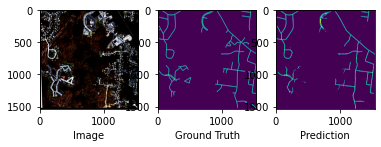

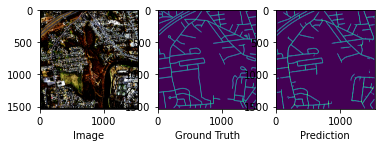

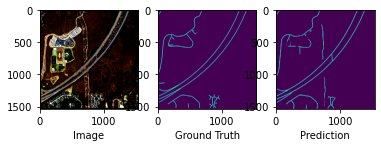

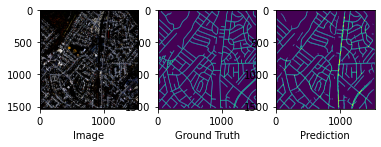

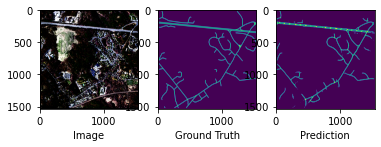

...

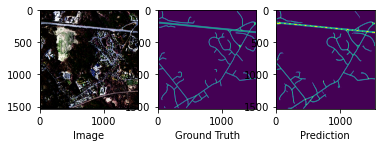

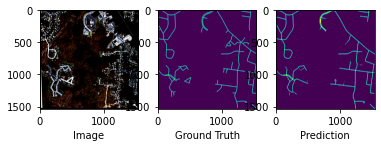

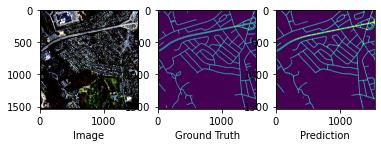

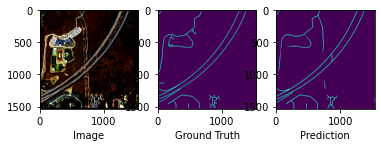

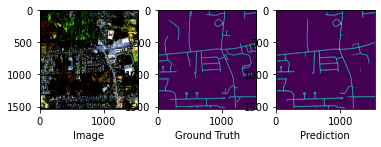

In [16]:
train_loss_values = []
valid_loss_values = []
train_iou_values = []
valid_iou_values = []

for epoch in range(200):
    loop = tqdm(train_loader)
    train_losses = []
    train_iou = []
    # training_loop
    model.train()
    for batch_id, (images, masks) in enumerate(loop):
        images = images.to(DEVICE)
        masks = masks.to(DEVICE)
        masks = masks.float().unsqueeze(1)
        
        outputs = model(images)['out']
        

        loss = criterion(outputs, masks)
        train_losses.append(loss.item())
        
        iou = mIoU(outputs, masks)
        train_iou.append(iou)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        loop.set_postfix(train_loss=loss.item(), train_miou=iou)
        
    # Validation loop    
    model.eval()
    valid_losses = []
    valid_iou = []

    with torch.no_grad():
        loop = tqdm(valid_loader)
        for i, (images, masks) in enumerate(loop):
            images = images.to(DEVICE)
            masks = masks.to(DEVICE)
            masks = masks.float().unsqueeze(1)

            outputs = model(images)['out']
            
            if (epoch+1) % 10 == 0:
                img = images[0].permute(1, 2, 0).cpu()
                mask = masks[0].squeeze(0).cpu()
                preds = torch.sigmoid(outputs)
                preds = (preds > 0.5).float()
                pred = preds[0].cpu().squeeze(0)

                plot_images(img, mask, pred)
            
            val_loss = criterion(outputs, masks)
            valid_losses.append(val_loss.item())

            val_iou = mIoU(outputs, masks)
            valid_iou.append(val_iou)
            
            loop.set_postfix(valid_loss=val_loss.item(), valid_miou=val_iou)
                
        
        
    scheduler.step()
        
    train_loss_values.append(np.mean(train_losses))
    valid_loss_values.append(np.mean(valid_losses))
    train_iou_values.append(np.mean(train_iou))
    valid_iou_values.append(np.mean(valid_iou))
    
    
    if (epoch+1) % 10 == 0:
        torch.save(model.state_dict(), "fcn_cosine.pt")
        
        
        
        
    print(f"Epoch-{epoch+1} Train mean loss: {np.mean(train_losses):.4f} Train MIOU: {np.mean(train_iou):.4f}")
    print(f"Epoch-{epoch+1} Valid mean loss: {np.mean(valid_losses):.4f} Valid MIOU: {np.mean(valid_iou):.4f}")

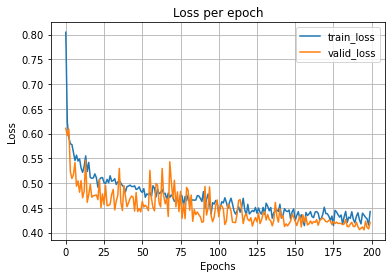

In [17]:
#Plotting Loss
plt.plot(train_loss_values, label='train_loss')
plt.plot(valid_loss_values, label='valid_loss')
plt.title('Loss per epoch')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.grid()
plt.show()

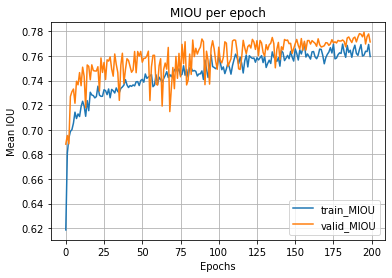

In [18]:
# Plotting Mean IOU
plt.plot(train_iou_values, label='train_MIOU')
plt.plot(valid_iou_values, label='valid_MIOU')
plt.title('MIOU per epoch')
plt.xlabel('Epochs')
plt.ylabel('Mean IOU')
plt.legend()
plt.grid()
plt.show()

In [16]:
# inference_model = ConvMixer_UNET_down(CLASSES).to(DEVICE)
# Image size = 1504
weights = torch.load("fcn_cosine.pt", map_location=DEVICE)
model.load_state_dict(weights)



def pixel_accuracy(output, mask):
    with torch.no_grad():
        output = torch.argmax(F.softmax(output, dim=1), dim=1)
        correct = torch.eq(output, mask).int()
        accuracy = float(correct.sum()) / float(correct.numel())
    return accuracy


model.eval()
with torch.no_grad():
    total_list = []
    for batch_id, (images, masks) in enumerate (tqdm(test_loader)):
        images = images.to(DEVICE)
        masks = masks.to(DEVICE).squeeze(1).long()
        
        outputs = model(images)['out']
        miou_list = mIoU(pred_mask = outputs, mask=masks, n_classes=2) 
        total_list.append(miou_list)
print(np.mean(total_list))

  0%|          | 0/25 [00:00<?, ?it/s]/data1/hom1/ict11/.conda/envs/ict11-smp/lib/python3.8/site-packages/torch/nn/functional.py:1806: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")
100%|██████████| 25/25 [00:09<00:00,  2.76it/s]

0.8030170008462725


In [17]:
class UnNormalize(object):
    def __init__(self, mean, std):
        self.mean = mean
        self.std = std

    def __call__(self, tensor):
        """
        Args:
            tensor (Tensor): Tensor image of size (C, H, W) to be normalized.
        Returns:
            Tensor: Normalized image.
        """
        for t, m, s in zip(tensor, self.mean, self.std):
            t.mul_(s).add_(m)
            # The normalize code -> t.sub_(m).div_(s)
        return tensor
unnorm = UnNormalize(mean=[0.4299, 0.4328, 0.3964], std=[0.2711, 0.2666, 0.2816])

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

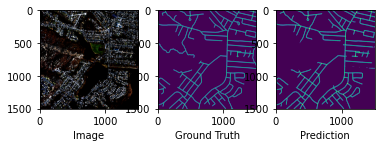

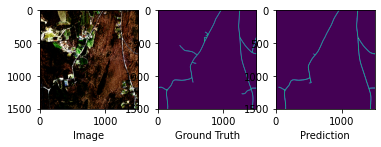

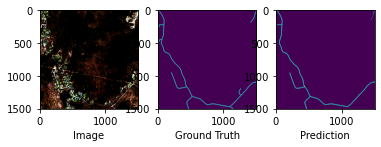

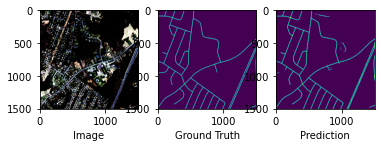

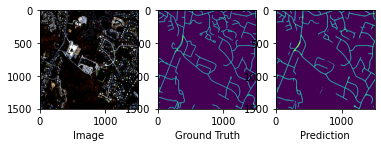

...

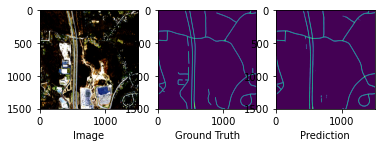

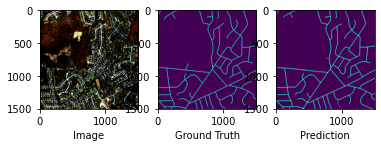

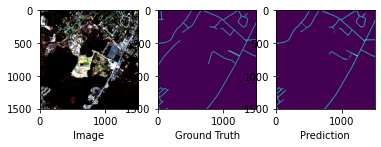

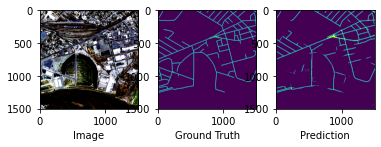

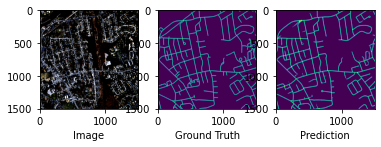

In [18]:
with torch.no_grad():
    model.eval()
    folder = 'Image_results/FCN'
    for i, data in enumerate(test_set):
        images, masks = data
        images = images.unsqueeze(0).to(DEVICE)
        masks = masks.to(DEVICE)
        masks = masks.float()

        outputs = model(images)['out']

        img = images.squeeze(0).permute(1, 2, 0).cpu()
        mask = masks.squeeze(0).cpu()
        preds = torch.sigmoid(outputs)
        preds = (preds > 0.5).float()
        pred = preds[0].cpu().squeeze(0)
        pred[pred == 1] = 255
        
        image = unnorm(images)
        torchvision.utils.save_image(image, f"{folder}/image_{i}.png")
        torchvision.utils.save_image(masks, f"{folder}/mask_{i}.png")
        torchvision.utils.save_image(pred, f"{folder}/pred_{i}.png")

        plot_images(img, mask, pred)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


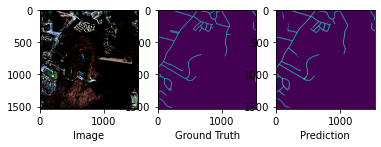

In [20]:
with torch.no_grad():
    model.eval()
    images, masks = test_set[20]
    images = images.unsqueeze(0).to(DEVICE)
    masks = masks.to(DEVICE)
    masks = masks.float()

    outputs = model(images)['out']

    img = images.squeeze(0).permute(1, 2, 0).cpu()
    mask = masks.squeeze(0).cpu()
    preds = torch.sigmoid(outputs)
    preds = (preds > 0.5).float()
    pred = preds[0].cpu().squeeze(0)

    plot_images(img, mask, pred)

In [18]:
# Image size = 1536
import torchmetrics as tm
f1 = tm.F1(num_classes=2, average='macro', multiclass=True, mdmc_average='samplewise')
p = tm.Precision(num_classes=2, average='macro', multiclass=True, mdmc_average='samplewise')
r = tm.Recall(num_classes=2, average='macro', multiclass=True, mdmc_average='samplewise')

model.eval()
with torch.no_grad():
    iou_list, f1_list, p_list, r_list = [], [], [], []
    for batch_id, (images, masks) in enumerate (tqdm(test_loader)):
        images = images.to(DEVICE)
        masks = masks.to(DEVICE).long()
        
        
        outputs = model(images)['out'].squeeze(1)
#         pred_mask = nn.functional.sigmoid(outputs)
#         pred_mask = (pred_mask > 0.5).long()
#         print(masks.shape, outputs.shape)
        
        iou = mIoU(outputs.cpu(), masks.cpu())
        fone = f1(outputs.cpu(), masks.cpu())
        pi = p(outputs.cpu(), masks.cpu())
        ar = r(outputs.cpu(), masks.cpu())
        
        iou_list.append(iou)
        f1_list.append(fone)
        p_list.append(pi)
        r_list.append(ar)
        
print(f" MIOU: {np.mean(iou_list)}, P: {np.mean(p_list)}, R: {np.mean(r_list)}, F1: {np.mean(f1_list)}")

100%|██████████| 25/25 [01:07<00:00,  2.70s/it]

 MIOU: 0.7922875923059225, P: 0.8773378729820251, R: 0.8709383606910706, F1: 0.8726657032966614


In [19]:
# Image size = 1504
import torchmetrics as tm
f1 = tm.F1(num_classes=2, average='macro', multiclass=True, mdmc_average='samplewise')
p = tm.Precision(num_classes=2, average='macro', multiclass=True, mdmc_average='samplewise')
r = tm.Recall(num_classes=2, average='macro', multiclass=True, mdmc_average='samplewise')

model.eval()
with torch.no_grad():
    iou_list, f1_list, p_list, r_list = [], [], [], []
    for batch_id, (images, masks) in enumerate (tqdm(test_loader)):
        images = images.to(DEVICE)
        masks = masks.to(DEVICE).long()
        
        
        outputs = model(images)['out'].squeeze(1)
#         pred_mask = nn.functional.sigmoid(outputs)
#         pred_mask = (pred_mask > 0.5).long()
#         print(masks.shape, outputs.shape)
        
        iou = mIoU(outputs.cpu(), masks.cpu())
        fone = f1(outputs.cpu(), masks.cpu())
        pi = p(outputs.cpu(), masks.cpu())
        ar = r(outputs.cpu(), masks.cpu())
        
        iou_list.append(iou)
        f1_list.append(fone)
        p_list.append(pi)
        r_list.append(ar)
        
print(f" MIOU: {np.mean(iou_list)}, P: {np.mean(p_list)}, R: {np.mean(r_list)}, F1: {np.mean(f1_list)}")

100%|██████████| 25/25 [01:09<00:00,  2.77s/it]


 MIOU: 0.8006746495294981, P: 0.8891454339027405, R: 0.8724743723869324, F1: 0.8793045878410339
